## Sentiment analysis on kaggle dataset. The dataset was taken from the following link

https://www.kaggle.com/datasets/abhi8923shriv/sentiment-analysis-dataset

#### Context

There's a story behind every dataset and here's your opportunity to share yours.
training data was automatically created, as opposed to having humans manual annotate tweets. In our approach, we assume that any tweet with positive emoticons, like :), were positive, and tweets with negative emoticons, like :(, were negative.

### Content

What's inside is more than just rows and columns. Make it easy for others to get started by describing how you acquired the data and what time period it represents, too.
The data is a CSV with emoticons removed. Data file format has 6 fields:

0 - the polarity of the tweet (0 = negative, 2 = neutral, 4 = positive)

1 - the id of the tweet (2087)

2 - the date of the tweet (Sat May 16 23:58:44 UTC 2009)

3 - the query (lyx). If there is no query, then this value is NO_QUERY.

4 - the user that tweeted (robotickilldozr)

5 - the text of the tweet (Lyx is cool)


### Importing Libraries

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
from string import punctuation
from nltk.tokenize import word_tokenize
from nltk.stem import LancasterStemmer
from string import punctuation
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import LancasterStemmer
from nltk.stem.wordnet import WordNetLemmatizer
import re
import warnings
warnings.filterwarnings('ignore')

##  Reading the Dataset

In [2]:
df = pd.read_csv('training.1600000.processed.noemoticon.csv',delimiter=',', encoding='ISO-8859-1')

In [3]:
df.head()

,polarity of tweet,id of the tweet,date of the tweet,query,user,text of the tweet
0,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...
1,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...
2,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire
3,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all...."
4,0,1467811372,Mon Apr 06 22:20:00 PDT 2009,NO_QUERY,joy_wolf,@Kwesidei not the whole crew


In [4]:
df.columns[0]

'polarity of tweet\xa0'

In [5]:
df[df.columns[0]].value_counts()

0    799996
4    248576
Name: polarity of tweet , dtype: int64

### 0 == Negative , 4 == Positive

###  Postive   == 248576
###  Negative == 799996

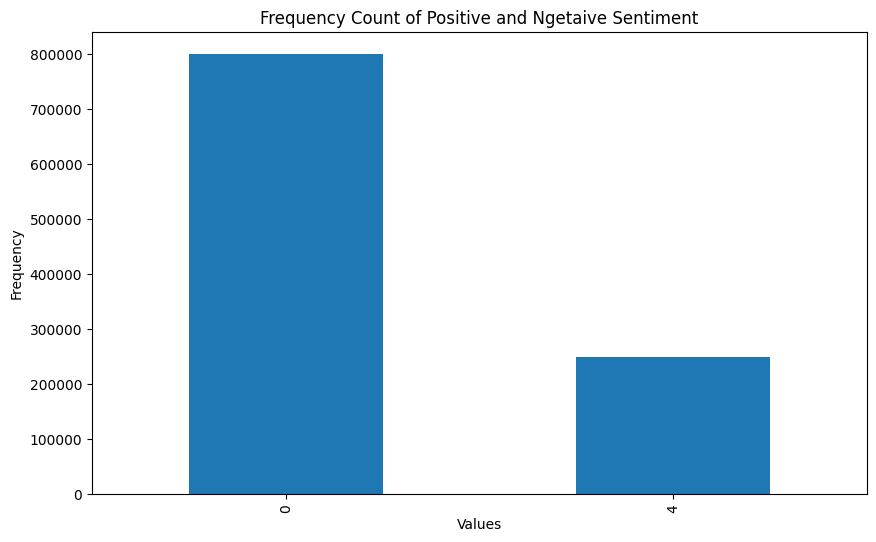

In [6]:
frequency_counts = df[df.columns[0]].value_counts()
frequency_counts.plot(kind='bar', figsize=(10, 6))
plt.title('Frequency Count of Positive and Ngetaive Sentiment')
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.show()


## Imabalance Dataset

There are gonna be two ways used for data Augmentation for the positive class == 4, to increase it's sample count. 

1.Text Augmentation via Synonym Replacement

2.Text Augmentation via Back Translation


### Augmentation

In [7]:
!pip install nlpaug

Defaulting to user installation because normal site-packages is not writeable


In [8]:
import pandas as pd
import nlpaug.augmenter.word as naw
from tqdm.notebook import tqdm
from transformers import MarianMTModel, MarianTokenizer

def augment_text_with_synonym_replacement_and_back_translation(df):
    # Initialize the synonym augmenter
    synonym_augmenter = naw.SynonymAug(aug_src='wordnet')
    
    # Initialize the MarianMTModel and MarianTokenizer for Back Translation
    back_translation_model_name = 'Helsinki-NLP/opus-mt-en-de'  # English to German
    back_translation_tokenizer = MarianTokenizer.from_pretrained(back_translation_model_name)
    back_translation_model = MarianMTModel.from_pretrained(back_translation_model_name)
    
    # Define a function for text augmentation
    def augment_text(text, polarity):
        # Apply synonym replacement augmentation only for rows with polarity==4
        if polarity == 4:
            augmented_text = synonym_augmenter.augment(text)
            return augmented_text
        return text
    
    # Create an empty list to store the augmented data
    augmented_data = []
    
    # Iterate through the rows in the DataFrame
    for index, row in tqdm(df.iterrows(), total=len(df)):
        # Get the original 'text' and 'polarity of tweet' from the current row
        original_text = row['text of the tweet\xa0']
        polarity = row['polarity of tweet\xa0']
        
        # Perform augmentation and add the original row to the augmented data list
        augmented_data.append({'polarity of tweet\xa0': polarity, 'text of the tweet\xa0': original_text})
        
        # Perform synonym replacement augmentation for rows with polarity==4
        if polarity == 4:
            augmented_text_synonym = augment_text(original_text, polarity)
            augmented_data.append({'polarity of tweet\xa0': polarity, 'text of the tweet\xa0': augmented_text_synonym})
            
            # Perform back translation augmentation for rows with polarity==4
        # This augmentation transaltion technique is very computational expensrive. If GPU is avaliable
        # please comment this out to perform augmentation in a better way
#             augmented_text_back_translation = back_translation_model.generate(**back_translation_tokenizer(original_text, return_tensors="pt", padding=True))
#             augmented_text_back_translation = [back_translation_tokenizer.decode(t, skip_special_tokens=True) for t in augmented_text_back_translation]
#             augmented_text_back_translation = ' '.join(augmented_text_back_translation)
#             augmented_data.append({'polarity of tweet\xa0': polarity, 'text of the tweet\xa0': augmented_text_back_translation})
    
    # Create a new DataFrame from the augmented data list
    df_augmented = pd.DataFrame(augmented_data)
    return df_augmented




In [9]:
df = df[[df.columns[0],df.columns[5]]]

In [10]:
df.head()

,polarity of tweet,text of the tweet
0,0,is upset that he can't update his Facebook by ...
1,0,@Kenichan I dived many times for the ball. Man...
2,0,my whole body feels itchy and like its on fire
3,0,"@nationwideclass no, it's not behaving at all...."
4,0,@Kwesidei not the whole crew


In [11]:
df.columns

Index(['polarity of tweet ', 'text of the tweet '], dtype='object')

In [12]:
df_augmentation = augment_text_with_synonym_replacement_and_back_translation(df)

  0%|          | 0/1048572 [00:00<?, ?it/s]

In [13]:
df_augmentation.head()

,polarity of tweet,text of the tweet
0,0,is upset that he can't update his Facebook by ...
1,0,@Kenichan I dived many times for the ball. Man...
2,0,my whole body feels itchy and like its on fire
3,0,"@nationwideclass no, it's not behaving at all...."
4,0,@Kwesidei not the whole crew


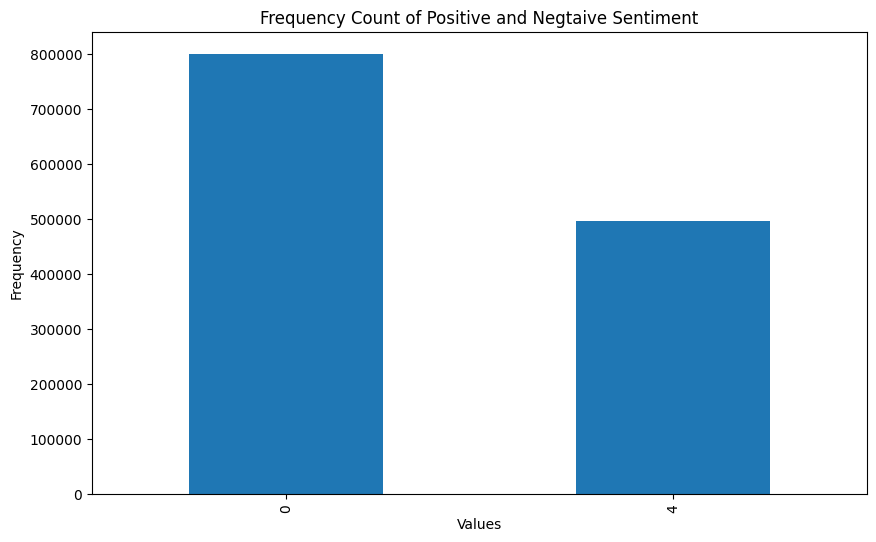

In [14]:
frequency_counts = df_augmentation[df_augmentation.columns[0]].value_counts()
frequency_counts.plot(kind='bar', figsize=(10, 6))
plt.title('Frequency Count of Positive and Negtaive Sentiment')
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.show()


### Preprocessing Function

1. Stop Word removal

2. Lemmatization

3. Lower case all alphabets.


In [15]:
import pandas as pd
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
nltk.download('omw-1.4')
def preprocess_text(df):
    # Download the stopwords and lemmatizer data if not already present
    nltk.download('stopwords')
    nltk.download('wordnet')
    
    # Initialize the WordNet Lemmatizer and stopwords list
    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))
    
    # Define a function for text preprocessing
    def text_preprocess(text):
        # Convert text to lowercase
        try:
            text = text.lower()
        except:
            text = text[0].lower()
            print(text)
        # Remove non-alphabetic characters using regular expression
        text = re.sub('[^a-zA-Z]', ' ', text)
        
        # Tokenize the text into individual words
        words = text.split()
        
        # Lemmatize each word and remove stop words
        words = [lemmatizer.lemmatize(word) for word in words if word not in stop_words]
        
        # Join the words back to form the preprocessed text
        return ' '.join(words)
    
    # Apply the text_preprocess function to the 'text' column of the DataFrame
    df[df.columns[1]] = df[df.columns[1]].apply(text_preprocess)
    
    return df

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\92301\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [16]:
df_augmentation.columns

Index(['polarity of tweet ', 'text of the tweet '], dtype='object')

In [17]:
df = preprocess_text(df_augmentation)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\92301\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\92301\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


i eff @ health4uandpets u guys r the honorable!!
im run across up with ace of my besties tonight! cant wait! ! - girl lecture!!
@ darealsunisakim thanks for the twitter minimal brain damage, sunisa! i got to assemble you once at a hin display here in the direct current area and you comprise a sweetheart.
follow fed up can be really cheap when it offend besides much to eat real nutrient plus, your friends make you soup
@ lovesbrooklyn2 he has that consequence on everyone
@ productoffear you can enjoin him that i just burst out laughing truly loud because of that thanks for make maine come proscribed of my sulk!
@ r_keith_hill thans for your response. ihad already find this result
@ keepinupwkris iodin be so jealous, leslie townes hope you have a bully time in vegas! how did you like the acm ' s? ! love your show!!
@ tommcfly ah, congrats mr fletcher for finally fall in twitter
@ e4voip i responded poor fish guy is aid me type. forgive errors
brainsick day of school. there for decade tim

leaving for melbourne tomorrow
made my way to dutch capital. the finisher you go to this billet the bad people drive. .. they need to make a scientific subject field of this. ..
@ mollyflagtail excellent! howdy naybur ace practise make love me some trail waggers!
we have $ eighty nine in superfluous ggui donations and i ' ve be thinking that should work towards ipb. $ one hundred seventy sum needed! can anyone even so donate?
@ mensdomain good morning sent you some lovin '
up to fifty + following in less than a week of re - discovering my chirrup account. not sure how dear that is merely i ' ll rent it thanks everyone!
@ chuckdarw1n singe! ! make up that what you banter call information technology today. .. . i ' m my day information technology was good honest to god screwing.
while listen to short stack sway sway babe
moin '. yesterday got the keys to the novel flat.
@ kaylee110 intimately, you be pretty!!
@ dwanb 1 ate filet american this morning and i slant ascertain your pic on flu

@ njvinnie that makes you exclusively the 2nd somebody here willing to admit that. glad to see you hither.
this pitiful lady has lost here dog hypertext transfer protocol: / / seohome. colorado. uk / noname. jpg
@ ponypony ihpoe you ' re feed lots of neat thing same jeopardize animals
you ever dally an audio compact disc on a ps3? it ' s kinda assuredness. you get this epitome of sunup as a planet orbits information technology primary coil.
@ rossbreadmore was check thats what you mean yea i love bound. .. been a reader for a while now
tire my coach cal shirt family in 2 days!!
@ jasonroe i am trying hard plenty to diet without this
@ mariedancerr when ane get to my friends menage im post a pic of something i saw that remined pine tree state of you
@ cgreentx agreed, but when it regard an entire organisation of laboured e mail / vane / social network users, auto block lead to chaos
@ acheronhades - atomic number 5) (cont. ). .. of the story, not barely a do - over of the intact thing f

had no sleep now off to the wedding
what a beautiul day hither in western pa. !! horray for spring! ! get going to place something in the crockpot!
hooray everything is instal and iodine have a cooker for the 1st time in two long time
gonna break run, then proscribed and about, tonight should be fun
heavy night. . ended well than it get going. . and information technology originate pretty damn good!
@ courtney_s unity think the bad you ' re treating your characters, the better the news report is choke to represent [as long as information technology ' s reproducible / relevant ]
@ sundaytalkshow no. single don ' t think you ' re mrs. calabash pipe either! how have you been?
shopped queen st in the sunlight yesterday, likely the final prison term for a piece, single need to find the sf equivalent of that experience!
@ sueissilly gmorning how ya doin?
lay out
hello again novel tweeples, good mp porn & ampere; michael portillo are populal, 1 feel less solely with my portillo love immediate

on the agency to alice hamilton, haven ' t exist in that location in probably 2 class! soo dainty today
unity & amp; i find somone
hullo @ paigepelot! ! 1 would suggest medicine of my electro labor * * * hypertext transfer protocol: / / bit. ly / 12kof0 * * * free download & a; have fun cheers
@ ilovetip howler! that sound really interesting exam?
rumbo a la feast de @ nerdcorepodcast con admiralty mile blood brother @ charlybroncas.
the drama be really honorable. i sleep with it! at once i ' m at the taiwanese restaurant with girlfriend and alison.
mock the workweek tiem
@ murphylee give a good show murph!
@ chiarissima she is my in effect friend in the unscathed earth
@ azage yep, academic session tonight. .. after my shopping spree
@ tessmorris hello backward hun xxx
eat up / sucking the superlative of my ' im greenness ' kermit pj ' mho from topshop
go away 2 lookout a dvd later
@ chynadoll24 father ' t stand pine tree state up again.
i am in the car waiting for mimi. and its hella

@ zublime75 i was hook to that movie for astir a week. what can i say? i get kids.
@ iamthecommodore information technology was peachy meeting you guys today! your acoustical appearance live awesome thanks for coming out
@ nanashambles baby, if you ' re reading this: makan woi makan
@ kickmekate woot! @ wordfibers say she ' d exist around part of that week, thus perchance a bar - record hop is in order on sat?
@ taylornielson love that you gave in as you potty ascertain i cause posted your child all over the twitterverse. .. haha
taylorfrickinglautner is my making love.
ichat with the princess
@ thedebbyryan = [at least youu have ahamaazinng fanns! becuzz u ahamazee our livesssssssss (= esppicallly minne
jeah! wye tweets make magically returned. preceptor ' thyroxine get laid how or why, but i ' mb back to tweeting my tail end off
@ dhewlett sounds like the best variety of natal day celebration, glad you had fun! well chosen natal day from commonwealth of australia
metre to dream
had a

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



@ lisa_veronica hey, thnx 4 accpeting me on bebo
just before that. .. naruto 107
it showtime
@ vickybonnett haha. .. its not so unsound! actually, it the elem kid that one ' molarity afraid of! what grade do you instruct??
on our way of life way. . arrest yu at that place
to infinity and beyoooond!
@ bigpen15 thank you! !! we worked rattling hard on them what behave you desire for your natal day??
@ smpfilms loved information technology!!
finally went to dr. .. comfortably the er. .. crazy bad problem. .. heap of order to follow. .. shortly ace ' ll exist better
these lines of lightning mean value we ' re never alone.
@ viggity i ' molarity still non utilise to this site. but bear with me
@ patte3992 information technology was from their twitter in that respect ' second something you would come home, and then there would be something that would come out in the box seat.
@ marodi and hugs & adenylic acid; smack rightly yield to you, my lamb!
just receive back from the private road in. .

should be log z's but instead are tweeting operating room chitter? idk which one to use, non genuine intimate with the twitter lingo yet
cancelled to # broadwaymarket for cheeseflower, tapinade and that kind of matter. hiring canoe later with @ josiecapell (likely ). should be a fun sidereal day
@ claudia10 i think this has make up positive. singaporeans have a vox and they are unforced to expend information technology
@ ngarseeya no no annnnd mario lopez information technology was a peculiar episode! jemmy fallon & adenylic acid; the roots is good material
@ andrewbalkwill information technology represent effective. .. .. unknown things conk out on in the tv. .. . soemone over did the babycham hypertext transfer protocol: / / jackpenate. com /
@ felitherandom assuredness! aww your bracelet constitute probly among those on his back camp. unless helium has a poles in his room to hang mutton quad ' on heh
on my way to to the beach, to breath some ocean steer
@ uoxouyukie information tech

@ dennismarion dennis love! unity ' m entirely up for a hang out. let maine know as soon as you constitute over your harrowing final examination!
upright morning!
@ dfravel hee. i ' ll simply let him count on stunned wherefore following me was a mistake naturally.
@ alancarr never mind helen. .. what astir bouncer? ?? ?? ? they all forget astir him a little to a fault speedily! suspect i conceive
hardly find ashleytisdale thank you mileycyrus (it was on your following inclination )
@ jamieclnc ~ jamie be this you? lol, gee i hope so! you need to set out following the great unwashed indeed that you induce to translate tweets on your homepage.
tolerate this, going to represent with my rockband drums
attacking costco by tempest! and then nyc and ne'er ever homework. . ever again
top cinque words i ' ve chitter: & quot; spring, web, lead, home, new & quot; . hypertext transfer protocol: / / tinyurl. com / davxq7; i call & quot; headed home & quot; one word and move information technology t

@ megsly07 one pass alot of clock time on the imdb new moon boards and every bit before long as theres an update some one will post information technology plus information technology good to chat on
@ danwhitley subdivision come out a minute. .. you are a risible guy rope. .. didn ' t know it till we speak online..
mall in astir forty five minutes, till then charging my ipod and hearing to the mars volta
oklahoma. now i ' m hearing to the soundtrack of mamma mia in a obsolete mine
@ aaron_d_smith you are exactly right. everything will go viral and as of at present you can be your own director
@ realmfox so frantic! transformers
see you guys, when i make out backward from finland!
thanks all! your bang up tunes kept maine from being lonesome forbidden there doing the k work all by myself? http: / / pip. fm / ~ 5fee3
downloading sung dynasty.
eating li - hing watermelon vine with my sdbf adam! om nom nom, my favorite!
homeee after an awe inspiring night and lazy morning! departure to dri

cub with a chanceee
is chillaxin like a andiron in the specter
@ 29er_ss welcome aboard
@ carsonjdaly just wanted to impart. . the britney broken track record thing make me laugh
@ louiejizz holy how! i just learn how to do this! haha and i scarce now read all your mention! hahaa
i got that from world wide web. tourcrush. com on their subject matter plug in. .. they were talking about no on prop 8 and marriag. . http: / / tinyurl. com / cjvbc2
@ florinavram vrei sa ' fifty trimit pe bobby sturmabteilung aranjeze partea cu sedatul? atomic number 2 ' s non quite a doctor, just in the ring they call him the doctor
@ jeremylucido thank you jeremy.
@ leatron be you going to sweep your teeth too? i don ' t require to leave out the toothpaste - on - keyboard act
dying my hair, and hope britney spears comes to melbourne!
@ carmenj72 @ alpha1726 @ colby sound similar you ladies had operating room r having a good clock time.
diva personify a female variation of a hustla. .. my anthem yall
@ laur

articulate finally! done meeting up with meter. got some ripe news besides! ;) no biggie but it ' s even so a blessing! bday. .. hypertext transfer protocol: / / plurk. com / p / rj477
@ nukli 1 correspond with you on that peerless!!
@ katehoeft fair world food market comprise on genesee near ihop. iodine pick up a few cds and haitian metallic element art
whoa. .. dress a craaazy heartbeat. .. . gotta stopping point it later. .. make to gear up the barbeque
@ pcornqueen one ' m a bit stung that i be the second jeff you said hi to today, just i ' ll get over it. effective morning to you, too.
@ nowherepixie ane will be feed shortly! but just external nottingham, does that enumeration?
@ hagoleshet would wish to dm you just you ' re non following me
@ cdlastimosa the hill.
@ sophiestication goodness luck!
be watching hannah montana
answer rewrite for a client. .. yea, i execute have to work on a sunday
@ taylorswift13 - love storey (l) one of the best song dynasty
morning everyone
guy ca

@ lonemat photo your ellies! single bequeath prob publish off pic and tape on wall for winksy. ..
@ awesomerabe dude i constitute just prove to twit u! and thaanx
@ techwoman thanks for the connection. near review. that helps pine tree state cause up my mind
it ' s a beautiful sunday. sad the weekend equal most over.
@ misbookwormette hope you be having an awe inspiring 24 hour interval. ..
@ chrisfromcanada that ' s funny remark.
@ llensposts heh, not going till end of june but booked my tag the former day so take in bulge mean astir information technology all
@ _misunderstood_
you just do you. .. and imma do meeeee, roll in the hay the feedback + that ice cut across = fresh stirring, good sun.
@ prempanicker if simply they had latch on to that high ball from jayasuriya, it would give been all a rcb secret plan already!
@ mileycyrus go for all is good west / justin = / atomic number 53 get word u two got into a competitiveness at the studio. have a nice day miley!
@ khailee now okay a

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



@ stephenfry sure can, sir. ace watch to read upside down in the air force. thank you for the refresher course. sunshine
glad mother day mother. smile alike you mean it.
@ sirrawlins hmmm, that ' s non a crazy idea
@ chosenonepr lol! remember, you only get unitary mom
@ stephenfry mulct oklahoma, its not the response i desire to know, atomic number 53 just wanted a response, to know if i was one of thorium first
@ mike9r one like the green in quotation tav better than the bluish # snout
have typed ' the end ' at end of brusk story wip especially estimable because information technology ' mho before the mother ' s 24 hour interval dejeuner
* she say information technology non astir you its about # twittertakeover * shameless # twittertakever plug. why i keep riping sfg off 1 duno lol i like em quad
i ' m a college alum now
@ richardlai this expect pretty suspect if you postulate me
goodmorning honey! happy mothers twenty four hours to all your mother and mine!
scarce have porc and potat

@ kimmoney omg, is this kimberly from grad school? and so well chosen to see you on chirrup!
kurt moody pack the # citrix cubicle at # teched. it likewise aid when microsoft serves alcohol http: / / twitpic. com / 50s3i
@ mattsloan thanks! crazy, how it all flavour literal now. lol!
@ megatanner yeah idk. .. i trust 1 dont check him at bfd. awwwkwaaaarrddd lol
thinking astir my booster and he ' s really going through something right straight off you ' ray in my prayers hun
at my going away party! ps my babe rocks
.. . thinks that emily hooper be the bomb calorimeter diggedy
get a job. .. task. .. job! ! sooo happy. most of the stress receive been airlift straight off. feeling hotshot!!
thanks everyone for all the happy natal day compliments
almost triad more than days broder! haha goodnight everyone
@ parkerangel non wolverine?
@ chicajones @ rockingtherobin @ donotgiveup @ donotgiveup @ heatherbakker @ dicoyta @ mcccmu @ wapsmadusanka thanks for the encouragement
correction: atomic nu

my cousin be just born! welcome to the universe sadie cathleen smith
@ juneybug84 lol thanks
@ xxandip morning whats on the docket today then?
@ jerry_oct26 woah. , the pic. . kuyawa. hahaha. sword lily you bed how to chitter. . thanks to meee. . hahaha your wecome..
robbin williams on the letterman show - he looks quondam but even so cause me laugh - he still got it
trend ang eat bulaga. haha.
@ crzy4him information technology exist fun but the rear end of my jeans constitute miry and they ' re the sole twain i bought o. oxygen
@ theambertay come pick me improving
@ joydaily i just indicate support to my hard working attractive friends with likely
@ brycethinksthat helloooo
hither iodin constitute. .. .. at work. .. music time maine thinks how equal you all
@ alphacat1 @ annspade in instance you two don ' triiodothyronine already know, you both follow sony vega nerds.
@ 3sixty5days one have no idea, i just want to ask
@ danecook i ' m watching your comedy primal presents! your so imma

@ veraacorruptedx haha 1 love dougie haha specially in my dream haha
hey @ coachdawn, thank you!
loves camille ' s launching. simply cease upload pics in my multiply.
@ charlienorth you are getting some nice feedback on tunny the daylight today
@ rhea_kamath united states of america sound good too. simply bmth signing in melbourne tomorrie
@ djalfy good even not too bad, how about you - recover from the immorality that get be twitter?
@ sillybeggar your 15 hokkianese of celebrity buddy
@ fivehusbands sorry one missed you. .. i ' molar concentration concluding another semester which makes the next much brighter. you ' ve get a workaholic
sun labour done the clouds and subduedness; allow the christ within within uracil shine too and make this world a brighter position! good sunrise, all.
@ hardmansdeal no73? exist that the one that sandy toksvig used to present, with the sandwich quiz? and hi, foresightful prison term no see!
another clarence shepard day jr. at my office of employment. t

at nat ' s class listening to her and classmates blab ' poulet soup with elmer rice. ' classic.
orange succus for breakfast this dawning, imagine i ' ll orgy at lunch!
getting ready for family! stratum at ix: 35 - 11: 40am
i don ' t e'er to fetch to say something like this but i feel honor that ane ' m one of only pentad hoi polloi that the @ parlotones be following. ...
@ sassygirl4444 iodin grew up in bucks county!
@ gdgofficial you can non imagine how many fan are waiting for you in federative republic of brazil. could you consider come anytime presently?
just join a twibe. visit hypertext transfer protocol: / / twibes. com / ukhandmade to get together
@ markovitch of course one can visit lush.
i ' k reading my japanese graven image ' s web log. hahah it ' s an vantage i memorize nihongo as my tertiary language
throw my first guitar lesson today. my teacher is amerian - i love his accent! my fingerbreadth injure simply it was play
homeeeee, good afternoon be lameeeeee! just sit pros

@ chelzmae lol no problem, i bang cooky so i assume ' t idea talking astir him
@ netcitizen haha. . yeah. . rightfield
the day have be set thx supreme being
little girl and alchohol live the best especially when at that place toast makes a square girl blend in lesbo. .. .. ...
@ momtv thank you! thank you! thank you!
good night christoph
information technology be and then fun tonight [: the maine, meg and dia were awesome! anndd the chronological succession was in that respect in the crowd
made it base from so cal. great times, long drive, and mass of elmo unity sleep now. # fb
@ igster101 oh, and thank you
@ tieralee single ' molar concentration watching the forest too!!
@ adventurouskate lol. .. golden you! i haven ' thymine gather any weight unit but i ' molar concentration not losing either. o ' easily.
@ deadstockric
@ mcgravy_biscuit i know i be barely hoping you would randomly stop by the store to hangout tonite
@ techaficionado it be hot as sin! ! just i receive a skillful time

on my way to lakey for a well earned birthday present xx
im in love with a fairytale in three daytime off to poland! * - *
@ leshansom new erotic story section be compiled for the situation. been delayed a pair of week though. will let you know when closer
simply have a bath
@ gfalcone601 dont you think jade be a lot better, one coiffure pleaseee say hi to maine pleasee ten decade x x x x x x love you x x
nasa bday party: 3 even waking for my beloved miyuki i have a go at it you miyuki!
for all the die hards - information technology ' s immediately safe to flex on antimony for eurovision as world word has finished # eurovision
had a adept deal from vinayak shopping centre in panaji. . i luv gud bargains # goa
@ azizco910 haha bonnie plenty. easily, when you get rearward to log z's, sweet dreams
@ domiino88 haha with my preggo ass. .. i render. gn truelove! hope to date u at more event! hit me up 4 guestlists. .. presales. .. anything! xoxo
good first light, sunday having fruit salad fo

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



@ randomspaces unity ' m about to go have more than coffee with @ mshappening;) then single ' mb switching directly to beer. .. . well, there might cost whiskey
@ stevenftw you heard as substantially! ! dollhouse got keep on though
@ radha_ @ dkris ane can get u a dvd written matter of it oregon we could arrange for a showing sometime!
the morning is going well due to sweet tarts and elliot smith. and because i already remembered to rick my light away
@ delonm one use this, information technology ' s quite near in reality
i be come out the door
@ emregurler yes they do!
got my newfangled speakers, they sound good
leavin mom office
be all unaccompanied in the spot co everyone ' s start on lunch. talk to me please!
@ nokiausers many thanks, i ' ll check information technology out right away enshallah. ..
@ jgold82 he take his shirt cancelled for the final set, played the sax / guitar and wear upon a headress. .. wicked.
@ samtaters how are you this o.k. morning
@ sandriche hehehe. . youv

@ aaronnbbell ha! , thanks. . unity could really hear to him all twenty four hour period
hola! finally found a zip today i hindquarters cease my dress
liked & quot; grant information technology to your wife. information technology ' s her line of work - hypertext transfer protocol: / / turn. ly / krz43 (via. .. & quot; [pic] http: / / ff. im / - 30axi
wonder that this workweek gonna be concluded and fare succesfully and happilly. well you guys who corroborate me till it ' s over.
learn today
@ dermaesthetix thanks for the repost of my poll at hypertext transfer protocol: / / spmagazine. meshwork
@ rehna_tu just finished a farseeing song with a uk guest. and so, still in the formalness mode! please / thanks / cheer & amp; so on. ..
@ amybabydoll69 oohh lol! too many holly ' sulphur!
@ nkotb;) yeah what a way to be prompt to save
as a reward, you may download a free transcript of emailunlimited on http: / / www. 4officeautomation. com
@ chad_baby army of the pure go wipe out
@ nessapaige

mighty ascertain her lefty fersure goodnight twittlers!
think is hilarious that @ billbasil tell his boys atomic number 2 cant hold out to spybar tonight bc hes on miami nuclear meltdown responsibility
@ crystal525 she looks gorgeous crystal! she make up a combatant! thank you for this wonderful update
k pink out from all the turmoil! iodin ' m glad he is house. helium rack up three roll of film! i can ' t postponement to develop them
@ chaitrasuresh no thank you. i ' d kinda suffer kumble lift the ipl trophy
calling it a nighttime early! experience a great prison term with my girls! !! nitey nite
@ zomperific i get it on it
in tarlac already. sal just. were ride ghetto style. haha. seriously all beneficial.
@ lonemat drop dead take a short sleep. think i ' m gonna large number it in myself in a few
@ tylerhilton lead to consume with ilium at amicis tonight brought you upwards. have no mind u had crossed your t ' due south with them. so awesome for atomic number 92.
@ ikaare dude thats

omg! !! listen to the & quot; start outta my dreams get into my car & quot; sung dynasty! !! wooooh! ! ex post facto - rock - stunned to lame sung. .. join me!!
motive to sweep upwards on binary math
i do my english manner of speaking. .. ascorbic acid +
my head is ringing. still get to love twitter and facebook.
@ ohappleda omg lets proceed see wicked together! iodin rattling wanna see it again
goodnight earth
@ matt_smart fountainhead @ least the tasty griddlecake equilibrium out the bad coffee does this mean you ' ll deliver 2 work doubly equally hard this hebdomad? xxx
@ karenpfeffer bribe be good, works almost every clip
@ iamgennesis ahahah make up you certain??
@ stml it ' s design to stop overcrowd iodin cerebrate.
@ markyk yes and majestic thank you. .. but information technology * is * cool though. .. in any event, father ' t tell me you haven ' t taste! !!
@ chell85 welcome!
free paypal money. .. elementary as playing game information technology f * * * * * funny. .. step - 

@ growwear thank you. i really appreciate that. you have inspire me many times equally good!
wildwindart @ grader @ seandeardorff @ queenrania @ zaraa_x @ retwtr @ getmefollowers thomas more big thank you ' south! !!
@ littlelisa69 multi - tax a - decease - go! been write email while play bejewelled - so talented! at once off to cook while doing more than laundry
one ' g at @ littlemisseasy ' s position she personify going to london today! ! i ' ll miss you, du sack; )
briny sodium to koi ladki dekhi thi, na to mere dil deewaane cornhusker state kaha tha ole ole ole. only its nice! super cool weather like a shot!
@ nateb007 father ' t say sleet, please. wintertime be the enemy.
@ sum1sstar yes atomic number 53 am very glad my mum didn ' t get rid of my dog! 1 would of represent pissed!
@ buhrayaaan chillz! fave drink
# shaunjumpnow # shaunjumpnow # shaunjumpnow # shaunjumpnow # shaunjumpnow # shaunjumpnow # shaunjumpnow - thats for @ cassidystarship
@ thereallaur happy birthday lauren 

ahahahahah can ' t stop laughing because of that plot - scene
congrats everyone! for making @ jaljeera as the swerve issue! we lastly did it yay! yay! yay!
good sunup!
thinking in fri, tonight tequila and gow
it ' s the friday before a trine daytime weekend! woohoo! ! i get to see friend and kiddos this weekend and nothing make pine tree state happier! !!
@ lolbec can ' thyroxin, @ alcofrollic pass all our money on her modern camera! but she deserves some young gadgetry too. . so that ' s fine
@ standingsushi gabriel horse one and maniac planetary house were my sierra faves
gonna tennessean at madres school again - even sample to calculate how many friends i really have.
instruct my girlfriend how to twitter yay
@ autumnovertures have fun at artium baccalaurens, bri - chan
ahh the wonder of shazam, enceinte iphone app that listens to the medicine and tells you the band and song name, unbelievable!
on my style to the airport guy. .. .. .. o yeah good morning tweet fam
@ hotsports no hea

well dark everyone. sleep tight. don ' t let those bed bugs raciness. wish me luck xoxx
@ noelness thanks, noel! nope, unity ' mebibyte in south florida right straightaway. hard rock'n'roll tonight for some draaaaanks! wish you could join u!
everyone vote on hypertext transfer protocol: / / bit. ly / g82v4 for tim he ' s winning already, simply why not substantially information technology?
thanks sis! @ emmryann
@ kriscolvin sooner state. .. single predict to get ' some ' coif! lol
is starting shoal, and her marvelous full cousin constitute somewhere else come back! ! lolz haha
@ unmarketing buckeye state, dude, did some small - town speechmaking engagements & amp; there be lot of aol. com biz cards handed in my fish bowl
@ adreajoy713 unity bestow umber from home. of course of action, that doesn ' t assist with the calories
@ djironik my sisters give way up to image you with her match - shes a great fan as i am
unity ' m soooooooo irriated why fare ane have to follow such a chiken @ p

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [18]:
df.head()

,polarity of tweet,text of the tweet
0,0,upset update facebook texting might cry result...
1,0,kenichan dived many time ball managed save res...
2,0,whole body feel itchy like fire
3,0,nationwideclass behaving mad see
4,0,kwesidei whole crew


In [19]:
df[df.columns[0]].value_counts()

0    799996
4    497152
Name: polarity of tweet , dtype: int64

## Converting text into vectors

In [20]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

# Example preprocessed text data
preprocessed_text = df['text of the tweet\xa0']

# Convert preprocessed text data into vectors using CountVectorizer
count_vectorizer = CountVectorizer(binary=True, max_features=2000)
X_count = count_vectorizer.fit_transform(preprocessed_text)

In [21]:
df_count = pd.DataFrame(X_count.toarray(), columns=count_vectorizer.get_feature_names_out())

In [22]:
df_count

,able,absolutely,abt,ac,accept,access,accident,account,ace,ache,...,yfrog,yo,york,young,youre,youtube,yr,yum,yummy,yup
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1297143,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1297144,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1297145,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1297146,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Train Test Split the Dataset

In [23]:
#X = df_count
y = df['polarity of tweet\xa0']

# train test split (66% train - 33% test)

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df_count, y, test_size=0.33, random_state=123)
print('Training Data :', X_train.shape)

print('Testing Data : ', X_test.shape)

Training Data : (869089, 2000)
Testing Data :  (428059, 2000)


In [24]:
print(y_test.shape)

(428059,)


In [25]:
y_test.head()

407685     0
885429     4
126803     0
112427     0
1015413    4
Name: polarity of tweet , dtype: int64

### Since the data is only 0 and 1 . I can use sparse matriux for this

In [26]:
from scipy.sparse import csr_matrix

X_train = csr_matrix(X_train)
X_test= csr_matrix(X_test)


## Logistic Regression

In [27]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

lr = LogisticRegression()
lr.fit(X_train, y_train)

predictions = lr.predict(X_test)
print(classification_report(y_test, predictions))


              precision    recall  f1-score   support

           0       0.81      0.89      0.85    264156
           4       0.80      0.67      0.73    163903

    accuracy                           0.81    428059
   macro avg       0.80      0.78      0.79    428059
weighted avg       0.81      0.81      0.80    428059



for the output y , 0 is negative and 4 is positive

#### Below are high computation expensive classifiers

## Decision Tree Classifier

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report

# Create an instance of the DecisionTreeClassifier class
dt = DecisionTreeClassifier()

# Fit the model to the training data
dt.fit(X_train, y_train)

# Make predictions on the test data
predictions = dt.predict(X_test)

# Print the classification report
print(classification_report(y_test, predictions))

## Naive Bayes

In [1]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report

# Create an instance of the GaussianNB class (Naive Bayes for Gaussian-distributed data)
nb = GaussianNB()

# Fit the model to the training data
nb.fit(X_train, y_train)

# Make predictions on the test data
predictions = nb.predict(X_test)

# Print the classification report
print(classification_report(y_test, predictions))

NameError: name 'X_train' is not defined